# Sentiment Analysis - Visualizations

Run on colab:

In [1]:
!pip install Cython
!pip install whatthelang
!pip install tensorflow
!pip3 install nest_asyncio
!pip install tweet-preprocessor
!pip install twint
!pip3 install --user --upgrade git+https://github.com/twintproject/twint.git@origin/master#egg=twint
!pip install --upgrade ipykernel # important
!pip install chart-studio # visualization
!pip install wordcloud
!pip install yfinance
!pip install vaderSentiment
!pip install transformers 
!pip install plotly==5.8
!pip install textblob seaborn nltk
!pip install pyyaml==5.4.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 786 kB 7.3 MB/s 
     |████████████████████████████████| 871 kB 62.4 MB/s 
     |████████████████████████████████| 244 kB 87.9 MB/s 
  Created wheel for whatthelang: filename=whatthelang-1.0.1-py3-none-any.whl size=789818 sha256=a48d6ac5b64c926db89cbaecc1e1032611130d5d9268bd9935cd0ab1ba0d279f
  Stored in directory: /root/.cache/pip/wheels/91/5b/fe/43b4b1eb6511aed55a9c5ecf3a178a9b06d783a58907dbc87b
  Created wheel for pyfasttext: filename=pyfasttext-0.4.6-cp37-cp37m-linux_x86_64.whl size=1461144 sha256=22f9b02c18f7a4c2305a24224664d5848408c0bed23279456934385de32d1a68
  Stored in directory: /root/.cache/pip/wheels/e6/e7/60/c4506ea3173416f3774e221bd741d06bfc2127ec23ceff6619
Successfully built whatthelang pyfasttext
Looking in indexes: https://pypi.org/simp

---

In [30]:

import pandas as pd
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
import plotly.graph_objects as go
import plotly.express as px
import tensorflow as tf

---

In [5]:
EPSILON = 0.1
TICKER = "BTC"
SEARCH_WORD = f"#{TICKER}"

DATE_SINCE = "2019-05-25"
DATE_UNTIL = "2019-06-24" 
file_name = "BTC_2019-05-25_2019-06-25__tweets_data_senitiments_scores.csv"

---

In [3]:
tweets_sentiment_df = pd.read_csv("./datasets/" + file_name)

In [7]:
# Remove textblob values around +-EPSILON from 0 [-EPSILON, +EPSILON]
non_zero_sentiment_df = tweets_sentiment_df[abs(tweets_sentiment_df.textblob) > EPSILON]

non_zero_sentiment_df.head()

,Unnamed: 0,date,text,textblob,vader,bert
4,4,2019-06-04 22:54:29+00,@DRomATX Always better to get a bargain price ...,0.175000,0.6693,1
5,5,2019-06-24 01:14:04+00,Someone asked me today if Ill buy a #Lambo whe...,-0.500000,0.7351,-1
9,9,2019-06-23 17:37:30+00,- Bitcoin Price Tops $10K for First Time Since...,0.250000,0.5106,1
10,10,2019-06-01 16:56:19+00,Can anyone point me in the direction of a char...,0.250000,0.3400,-1
11,11,2019-06-20 14:18:50+00,@wikileaks Add Bitcoin Cash donations. I can't...,-0.166667,0.0000,-1


## <u>**Histograms**</u>

### <u>**Sentiment/date**</u>

In [9]:
fig1 = px.histogram(tweets_sentiment_df, x="date", y="textblob", histfunc="avg", title='Average <b>TextBlob</b> polarity sentiment score per date for bitcoins tweets')
fig1.update_traces(xbins_size="D1")
fig1.update_xaxes(showgrid=True)
fig1.update_layout(bargap=0.1)
fig1.add_trace(go.Scatter(mode="markers", x=tweets_sentiment_df["date"], y=tweets_sentiment_df["textblob"], name="daily"))

fig2 = px.histogram(non_zero_sentiment_df, x="date", y="vader", histfunc="avg", title='Average <b>VADER</b> compound sentiment score per date for bitcoins tweets')
fig2.update_traces(xbins_size="D1")
fig2.update_xaxes(showgrid=True)
fig2.update_layout(bargap=0.1)
fig2.add_trace(go.Scatter(mode="markers", x=non_zero_sentiment_df["date"], y=non_zero_sentiment_df["vader"], name="daily"))

fig3 = px.histogram(non_zero_sentiment_df, x="date", y="bert", histfunc="avg", title='Average <b>ΒΕRΤ</b> sentiment score per date for bitcoins tweets')
fig3.update_traces(xbins_size="D1")
fig3.update_xaxes(showgrid=True)
fig3.update_layout(bargap=0.1)
fig3.add_trace(go.Scatter(mode="markers", x=non_zero_sentiment_df["date"], y=non_zero_sentiment_df["bert"], name="daily"))

fig1.show()
fig2.show()
fig3.show()

---

### <u>**Total sentiments count**</u>

In [11]:
fig1 = px.histogram(tweets_sentiment_df, x="textblob", nbins=12)
fig2 = px.histogram(tweets_sentiment_df, x="vader", nbins=12)

fig1.update_layout(
    title={
        'text':'<b>TextBlob</b> polarity sentiments\' scores from bitcoin tweets',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor':'top'
        },
    xaxis_title="Sentiment score",
    yaxis_title="Count")

fig2.update_layout(
    title={
        'text':'<b>VADER</b> compound sentiments\' scores from bitcoins tweets',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor':'top'
        },
    xaxis_title="Sentiment score",
    yaxis_title="Count")

fig3.update_layout(
    title={
        'text':'<b>BERT</b> sentiments\' scores from bitcoins tweets',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor':'top'
        },
    xaxis_title="Sentiment score",
    yaxis_title="Count")

fig1.show()
fig2.show()
fig3.show()

The histograms above display the distribution of sentiment values (polarity, vader, and bert) for tweets with the given ticker (e.g. "#XXX").

To get better visuals of the sentiment values, it can be helpful to remove the values around zero and create a break in the histograms there:

In [12]:
fig1 = px.histogram(non_zero_sentiment_df, x="textblob", nbins=12)
fig2 = px.histogram(non_zero_sentiment_df, x="vader", nbins=12)
fig3 = px.histogram(non_zero_sentiment_df, x="bert", nbins=12)

fig1.update_layout(
    title={
        'text':'<b>TextBlob</b> polarity sentiments from bitcoins tweets (non-zero sentiments)',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor':'top'
        },
    xaxis_title="Sentiment score",
    yaxis_title="Count")

fig2.update_layout(
    title={
        'text':'<b>VADER</b> compound sentiments\' scores from bitcoins tweets (non-zero sentiments)',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor':'top'
        },
    xaxis_title="Sentiment score",
    yaxis_title="Count")

fig3.update_layout(
    title={
        'text':'<b>BERT</b> sentiments\' scores from bitcoins tweets" (non-zero sentiments)',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor':'top'
        },
    xaxis_title="Sentiment score",
    yaxis_title="Count")

fig1.add_shape(
        go.layout.Shape(type='line', xref='x', yref='paper',
                        x0=0, y0=0, x1=0, y1=0.9, line={'dash': 'dash'}),
)

fig2.add_shape(
        go.layout.Shape(type='line', xref='x', yref='paper',
                        x0=0, y0=0, x1=0, y1=0.9, line={'dash': 'dash'}),
)

fig3.add_shape(
        go.layout.Shape(type='line', xref='x', yref='paper',
                        x0=0, y0=0, x1=0, y1=0.9, line={'dash': 'dash'}),
)

fig1.show()
fig2.show()
fig3.show()

For these histograms, sentiment values (polarity/vader) around zero [-EPSILON, EPSILON] have been removed, and a break has been added at zero, to better highlight the distribution of sentiment values.

We can see that VADER's compound attribute separates the sentiments more clearly, and we can quickly deduce the general sentiment (positive/negative).

## Get average sentiment score per date

In this section, we group the sentiment per date, and keep the average sentiment score for polarity and VADER.
For the BERT value, we take the average between all positive and negative labels and define it as the sentiment score for this feature.

In [13]:
avg_df = non_zero_sentiment_df.copy()
avg_df['date'] = pd.to_datetime(avg_df['date'], format='%Y-%m-%d').dt.strftime('%Y-%m-%d')
avg_df = avg_df.rename(columns={'date': 'Date'})
avg_df = avg_df.set_index('Date')
avg_df

,Unnamed: 0,text,textblob,vader,bert
Date,,,,,
2019-06-04,4,@DRomATX Always better to get a bargain price ...,0.175000,0.6693,1
2019-06-24,5,Someone asked me today if Ill buy a #Lambo whe...,-0.500000,0.7351,-1
2019-06-23,9,- Bitcoin Price Tops $10K for First Time Since...,0.250000,0.5106,1
2019-06-01,10,Can anyone point me in the direction of a char...,0.250000,0.3400,-1
2019-06-20,11,@wikileaks Add Bitcoin Cash donations. I can't...,-0.166667,0.0000,-1
...,...,...,...,...,...
2019-05-27,39988,LIVE at 5:15PM Baltimore time- The 1 #Bitcoin ...,0.266335,0.4168,-1
2019-06-08,39991,New Free Bitcoin CLOUD MINING Site 2019. Earn ...,0.268182,0.5106,-1
2019-06-22,39992,@valkenburgh @stephendpalley Bitcoin is exclud...,0.166667,-0.5106,-1


# Get average sentiment value (polarity/VADER) per day

In [14]:
avg_df = avg_df.groupby(['Date']).mean().reset_index().set_index('Date')
avg_df

,Unnamed: 0,textblob,vader,bert
Date,,,,
2019-05-25,20490.320144,0.266136,0.387321,-0.082734
2019-05-26,19893.842402,0.235698,0.351566,-0.073171
2019-05-27,19584.488774,0.260737,0.319692,-0.039724
2019-05-28,19938.126154,0.226744,0.348880,-0.126154
2019-05-29,19894.280453,0.240057,0.391482,-0.201133
2019-05-30,20489.941677,0.209241,0.365901,-0.246659
2019-05-31,19703.246154,0.216847,0.334489,-0.233846
2019-06-01,20831.706131,0.270526,0.418958,-0.090909
2019-06-02,20248.104247,0.264910,0.366581,-0.181467


# <u>**Yahoo Finance**</u>

We scatter the price for the specific ticker and compare it to next to the sentiments scores per day

In [15]:
import yfinance as yf
import datetime

In [16]:
since_date = datetime.datetime.strptime("2019-05-25", '%Y-%m-%d')
TODAY = datetime.datetime.strptime("2019-06-24", '%Y-%m-%d')

In [17]:
DATE_SINCE,DATE_UNTIL

('2019-05-25', '2019-06-24')

In [18]:
# create empty dataframe
stock_final = pd.DataFrame()

# iterate over each symbol
assets = ['BTC-USD']

for i in assets:
    # print the symbol which is being downloaded
    print( str(assets.index(i)) + str(' : ') + i, sep=',', end=',', flush=True)  
    
    try:
        # download the stock price 
        stock = []
        stock = yf.download(i,start=since_date, end=TODAY, progress=False)
        
        # append the individual stock prices 
        if len(stock) == 0:
            None
        else:
            stock['Name'] = i
            stock_final = stock_final.append(stock,sort=False)
    except Exception:
        None

0 : BTC-USD,

In [ ]:
# stock_final =

In [22]:
stock_final

,Open,High,Low,Close,Adj Close,Volume,Name
Date,,,,,,,
2019-05-24,7881.695312,8140.719727,7824.448730,7987.371582,7987.371582,25919126991,BTC-USD
2019-05-25,7991.885254,8117.925781,7965.976074,8052.543945,8052.543945,22256813107,BTC-USD
2019-05-26,8055.206055,8687.520508,7924.670410,8673.215820,8673.215820,26677970091,BTC-USD
2019-05-27,8674.072266,8907.174805,8668.705078,8805.778320,8805.778320,27949839564,BTC-USD
2019-05-28,8802.757812,8807.016602,8634.721680,8719.961914,8719.961914,24226919267,BTC-USD
2019-05-29,8718.591797,8755.852539,8482.728516,8659.487305,8659.487305,23473479966,BTC-USD
2019-05-30,8661.760742,9008.314453,8221.273438,8319.472656,8319.472656,29246528551,BTC-USD
2019-05-31,8320.286133,8586.659180,8172.550781,8574.501953,8574.501953,25365190957,BTC-USD
2019-06-01,8573.839844,8625.600586,8481.578125,8564.016602,8564.016602,22488303544,BTC-USD


Below, we attach the ticker's closing price per date to our avg_df

In [23]:
final_df = stock_final[["Adj Close"]].rename(columns={"Adj Close": "price"}).astype(float)
final_df = final_df.reset_index()
final_df['Date'] = pd.to_datetime(final_df['Date']).dt.strftime('%Y-%m-%d')
final_df = final_df.set_index('Date')


In [24]:
x = pd.DataFrame(final_df.price.diff())
x['diff_sign'] = np.sign(x.price)
x=x.drop(columns=["price"])

In [25]:
result = pd.concat([final_df,x, avg_df], axis=1, join="inner")
result

,price,diff_sign,Unnamed: 0,textblob,vader,bert
Date,,,,,,
2019-05-25,8052.543945,1.0,20490.320144,0.266136,0.387321,-0.082734
2019-05-26,8673.215820,1.0,19893.842402,0.235698,0.351566,-0.073171
2019-05-27,8805.778320,1.0,19584.488774,0.260737,0.319692,-0.039724
2019-05-28,8719.961914,-1.0,19938.126154,0.226744,0.348880,-0.126154
2019-05-29,8659.487305,-1.0,19894.280453,0.240057,0.391482,-0.201133
2019-05-30,8319.472656,-1.0,20489.941677,0.209241,0.365901,-0.246659
2019-05-31,8574.501953,1.0,19703.246154,0.216847,0.334489,-0.233846
2019-06-01,8564.016602,-1.0,20831.706131,0.270526,0.418958,-0.090909
2019-06-02,8742.958008,1.0,20248.104247,0.264910,0.366581,-0.181467


In [26]:
result_conf = result.copy()

In [27]:
result_conf['textblob'] = np.sign(result_conf.textblob)
result_conf['vader'] = np.sign(result_conf.vader)
result_conf['bert'] = np.sign(result_conf.bert)
result_conf[result_conf < 0] = 0
result_conf

,price,diff_sign,Unnamed: 0,textblob,vader,bert
Date,,,,,,
2019-05-25,8052.543945,1.0,20490.320144,1.0,1.0,0.0
2019-05-26,8673.215820,1.0,19893.842402,1.0,1.0,0.0
2019-05-27,8805.778320,1.0,19584.488774,1.0,1.0,0.0
2019-05-28,8719.961914,0.0,19938.126154,1.0,1.0,0.0
2019-05-29,8659.487305,0.0,19894.280453,1.0,1.0,0.0
2019-05-30,8319.472656,0.0,20489.941677,1.0,1.0,0.0
2019-05-31,8574.501953,1.0,19703.246154,1.0,1.0,0.0
2019-06-01,8564.016602,0.0,20831.706131,1.0,1.0,0.0
2019-06-02,8742.958008,1.0,20248.104247,1.0,1.0,0.0


In [28]:
from sklearn.metrics import recall_score,accuracy_score,precision_score

In [31]:
for x in ['textblob','vader','bert']:
    y_true, y_pred = result_conf['diff_sign'], result_conf[x]
    print("{0} pridictor:\n{1}".format(x,(tf.math.confusion_matrix(y_true, y_pred))))
    print("Accuracy:\t\t{0}".format(accuracy_score(y_true, y_pred)))
    print("Recall:\t\t\t{0}".format(recall_score(y_true, y_pred)))
    print("precision:\t\t{0}\n".format(precision_score(y_true, y_pred)))

textblob pridictor:
[[ 0 11]
 [ 0 19]]
Accuracy:		0.6333333333333333
Recall:			1.0
precision:		0.6333333333333333

vader pridictor:
[[ 0 11]
 [ 0 19]]
Accuracy:		0.6333333333333333
Recall:			1.0
precision:		0.6333333333333333

bert pridictor:
[[11  0]
 [19  0]]
Accuracy:		0.36666666666666664
Recall:			0.0
precision:		0.0



2022-07-31 09:53:26.567406: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Experimental results

## The comparison plot

In [34]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)

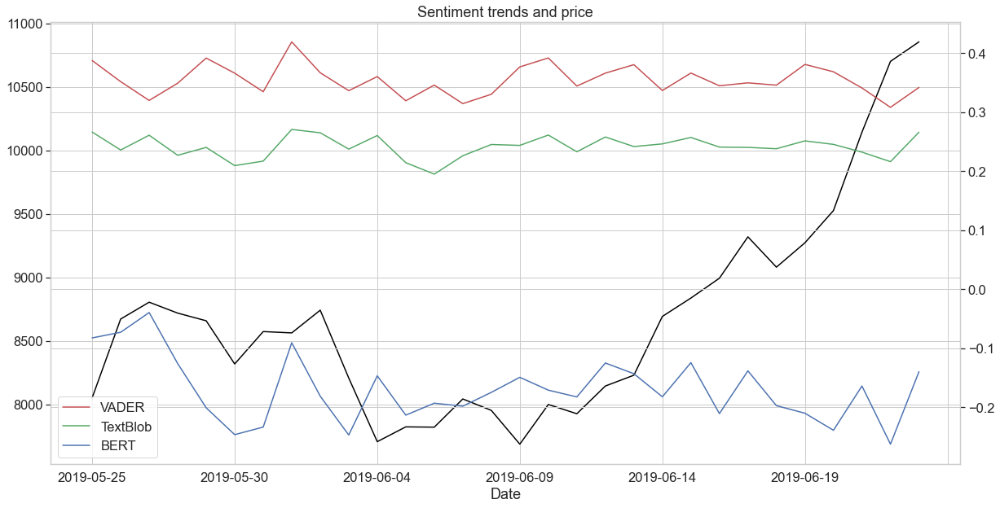

In [35]:
ax = result['price'].plot(color='black', label='price').twinx()
ax2 = result['vader'].plot(color='r', label='VADER')
ax3 = result['textblob'].plot(color='g', label='TextBlob')
ax4 = result['bert'].plot(color='b', label='BERT')

plt.xlabel('date')
plt.title('Sentiment trends and price')
plt.legend()
plt.show()

## Discussion

In figure 1 we see that all 3 models' sentiment measures averages are highly ("Spearman") correlated to one another (generally ascend/descend together) but are (unfortunately) not generally correlated with the actual price (in black).

The only difference is that VADER and TextBlob average scores are mostly positive (larger than 0) and BERT's are mostly negative  (smaller than 0). This can explain the differences in the Confusion Matrices.

It is worth mentioning that we trained the BERT model on IMDB movie critics, and this can be the main cause for the different scores with the other models. We used this training data because this was the closest example we've found (critics on movies as an example of critics on stocks).
We DID actually find a Twitter dataset but it was too large to train upon (15M entries).

The hypothesis of the bitcoin price being highly influenced by social media does not hold vacuously.\\
We assume there are other variables which are also taking place.
For example, the Stock's Index, employment rate, the company's earning, etc.